## Test E-matrix estimation on calibrated images
- Two RGB images have been undistorted and intrinsic matrix is known
- Two 3842 x 2878 RGB images 
- Using Harris corners to find correspondence candidates
- Two iterative methods - Gaussian resampling and recomputing E matrix

## 1. Retrieve corners from calibrated images

In [75]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt

img1 = cv2.imread('bulbc1.png') # third dimension: colour (BGR)
img2 = cv2.imread('bulbc2.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [76]:
img2.shape

(2878, 3842, 3)

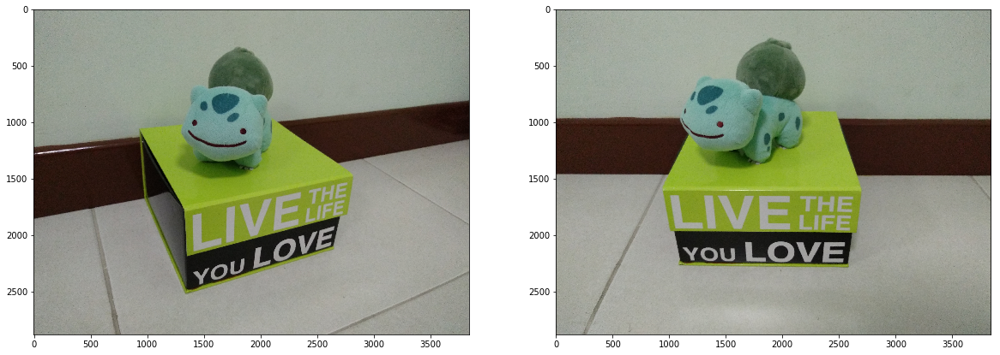

In [77]:
plt.figure(1, figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap = None, interpolation = None) 

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap = None, interpolation = None)

plt.show()

In [78]:
def img2harris(img, window=13, n_top=200):
    """
    Returns numpy array (num_corners, 2) of top n_top harris corners.

    Parameters
    ----------
    img : BGR image with values in 0-255
        Image returned by call to cv2.imread().
    window : integer
        Image is split into a mosaic of window x window regions. 
        For each region, only the highest corner value is kept.
    n_top: integer
        The remaining corner values are sorted, and the coordinates 
        of the top n_top corners are returned.
    
    """
    
    # convert to gray
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    
    # find harris corners
    dst = cv2.cornerHarris(gray,20,7,0.04) # dst is (rows, cols), not (x, y)
    
    highest = np.zeros_like(dst)
    
    # split into mosaic, keep only highest value per region
    for r in range(0, dst.shape[0], window):
        r_end = min(r + window, dst.shape[0])
        for c in range(0, dst.shape[1], window):
            # define end of window (limited by right edge of image)
            c_end = min(c + window, dst.shape[1])
            
            # write highest value to zeroed matrix
            m = np.max(dst[r:r_end, c:c_end])
            i = np.where(dst[r:r_end, c:c_end] == m)
            
            highest[r:r_end, c:c_end][i] = m
    
    # get top 200 from highest
    ind = np.argpartition(highest, -n_top, None)[-n_top:]
    ind = np.unravel_index(ind, highest.shape)
    
    return ind

In [208]:
# Store Harris corners in ind1, ind2
ind1 = img2harris(img1, 100, n_top=30)
ind2 = img2harris(img2, 100, n_top=30)

img1_disp = img1.copy()
img2_disp = img2.copy()

# Mark corners with red dots
# img1_disp[ind1] = [0,0,255]
# img2_disp[ind2] = [0,0,255]

for pt1 in (np.array(ind1).T):
    img1_disp = cv2.circle(img1_disp,(pt1[1],pt1[0]),20,(255,0,0),-1)

for pt2 in (np.array(ind2).T):
    img2_disp = cv2.circle(img2_disp,(pt2[1],pt2[0]),20,(255,0,0),-1)

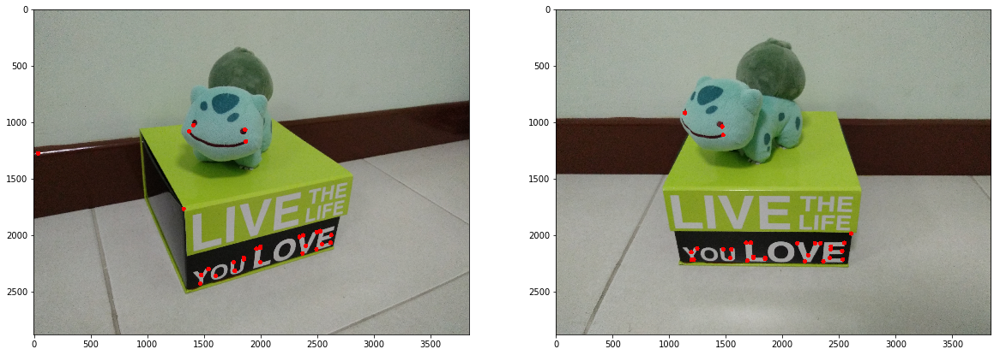

In [209]:
# Display results
plt.figure(1, figsize=(20,10))

plt.subplot(1, 2, 1)
plt.imshow(img1_disp)
# plt.xticks([]), plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(img2_disp)
# plt.xticks([]), plt.yticks([])

plt.show()

In [210]:
# Collect indices of corners (x, y)
c1 = np.array(ind1).T.astype(float)[:,[1,0]]
c2 = np.array(ind2).T.astype(float)[:,[1,0]]

In [211]:
# Normalise the points with intrinsic matrix
from numpy.linalg import inv

K = np.array([[3142.48386708,    0.        , 2008.49963471],
              [   0.        , 3156.22945417, 1484.50729327],
              [   0.        ,    0.        ,    1.        ]])

mtx_i = inv(K)

c1_f = np.concatenate((c1, np.ones((c1.shape[0], 1))), axis=1)
c2_f = np.concatenate((c2, np.ones((c2.shape[0], 1))), axis=1)

c1_norm = np.dot(mtx_i, c1_f.T)
c2_norm = np.dot(mtx_i, c2_f.T)

pts1 = c1_norm[:2].T
pts2 = c2_norm[:2].T

## 2. Run Particle Filter

In [212]:
import helpers
import numpy as np
from helpers import projectPoints, transformCamera
from math import sin, cos, pi

In [213]:
from importlib import reload
reload(helpers)

<module 'helpers' from 'D:\\Courses\\NUS\\DCVPC\\code\\helpers.py'>

D:\Courses\NUS\DCVPC\code\helpers.py:208: RuntimeWarning: invalid value encountered in less
  all_matches = dists < epsilon


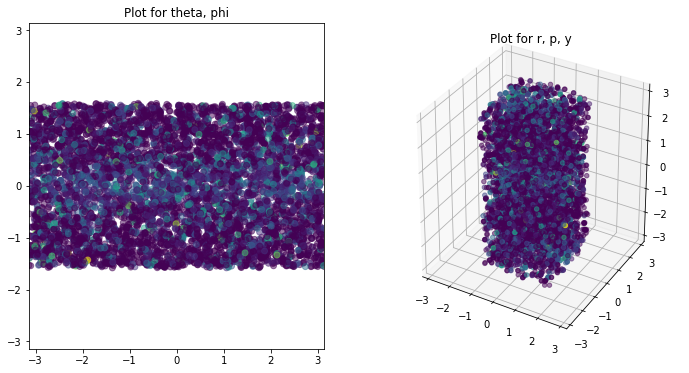

First 200 scores: [1, 2, 8, 0, 0, 4, 0, 0, 0, 0, 1, 1, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 3, 2, 1, 0, 0, 4, 0, 0, 0, 0, 0, 4, 0, 5, 2, 2, 7, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 4, 0, 4, 5, 1, 0, 9, 4, 0, 0, 6, 2, 0, 4, 0, 0, 1, 0, 2, 6, 0, 11, 3, 0, 8, 3, 2, 0, 0, 0, 0, 0, 0, 2, 1, 2, 0, 0, 1, 0, 1, 1, 6, 7, 7, 0, 3, 0, 0, 4, 0, 0, 2, 0, 3, 10, 1, 0, 0, 6, 0, 3, 2, 3, 1, 0, 6, 0, 0, 4, 0, 0, 6, 0, 1, 3, 1, 4, 0, 0, 0, 1, 0, 0, 7, 0, 0, 0, 4, 0, 5, 0, 1, 0, 0, 1, 0, 0, 0, 4, 9, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 9, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Non-match ratio: 0.000000 (0/11391)
Sigma: ['0.010000', '0.010000', '0.010000', '0.010000', '0.010000']
Epsilon: 0.002000
Iteration: 1
Elapsed time: 11.669636s


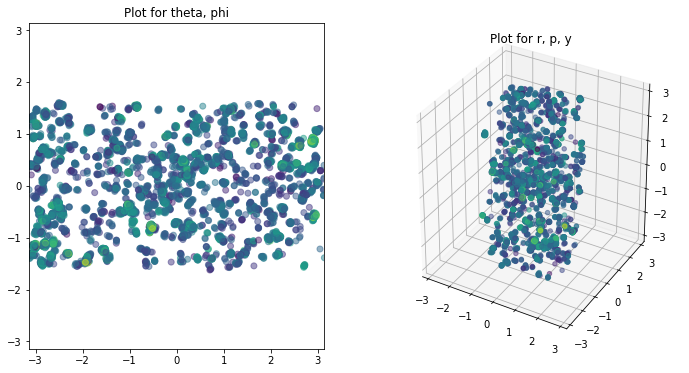

First 200 scores: [7, 7, 7, 8, 6, 8, 4, 8, 9, 2, 10, 10, 10, 7, 9, 8, 4, 4, 8, 5, 11, 11, 6, 3, 11, 6, 9, 7, 8, 4, 7, 7, 10, 12, 7, 8, 5, 8, 3, 7, 8, 7, 7, 6, 6, 11, 6, 10, 9, 3, 7, 8, 1, 4, 9, 5, 6, 7, 13, 9, 4, 8, 6, 8, 8, 9, 9, 10, 6, 4, 5, 15, 3, 11, 13, 6, 7, 6, 6, 6, 6, 8, 8, 8, 6, 10, 7, 5, 2, 7, 6, 8, 4, 7, 5, 8, 6, 3, 8, 12, 7, 8, 8, 7, 12, 7, 6, 10, 8, 8, 10, 8, 13, 4, 8, 6, 4, 11, 9, 8, 4, 7, 6, 7, 4, 8, 14, 10, 13, 8, 8, 10, 7, 9, 8, 8, 10, 12, 12, 9, 5, 7, 6, 13, 10, 3, 10, 7, 8, 8, 6, 6, 11, 14, 9, 6, 8, 11, 5, 9, 10, 4, 6, 10, 5, 7, 5, 6, 7, 5, 7, 6, 8, 7, 10, 9, 7, 4, 10, 8, 6, 10, 10, 8, 2, 10, 5, 8, 3, 6, 8, 9, 6, 8, 5, 7, 3, 6, 6, 8]
Non-match ratio: 0.000000 (0/62550)
Sigma: ['0.007000', '0.007000', '0.007000', '0.007000', '0.007000']
Epsilon: 0.001800
Iteration: 6
Elapsed time: 61.782727s


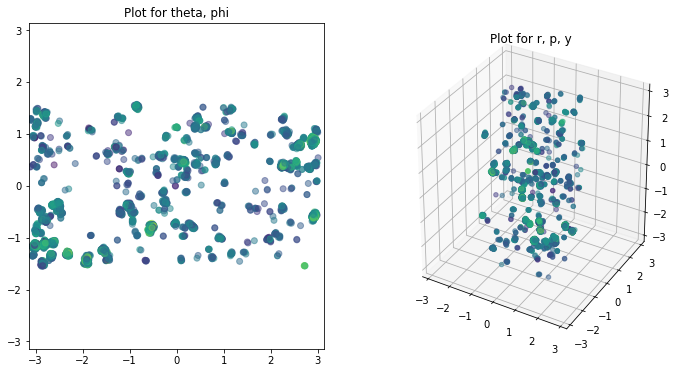

First 200 scores: [6, 6, 11, 9, 11, 8, 9, 13, 12, 11, 9, 6, 10, 3, 12, 8, 8, 12, 11, 9, 9, 5, 9, 8, 12, 6, 9, 7, 17, 12, 10, 10, 7, 9, 8, 10, 8, 11, 7, 9, 7, 15, 8, 10, 12, 5, 10, 16, 10, 11, 6, 11, 11, 11, 15, 13, 9, 11, 10, 10, 12, 6, 11, 9, 11, 10, 8, 13, 9, 16, 10, 9, 9, 10, 12, 10, 6, 13, 11, 12, 7, 5, 11, 8, 11, 12, 12, 10, 9, 9, 6, 14, 10, 8, 11, 12, 12, 12, 10, 12, 7, 10, 7, 12, 6, 11, 12, 13, 6, 13, 12, 5, 10, 14, 12, 13, 8, 11, 7, 10, 12, 13, 11, 12, 9, 8, 9, 4, 11, 11, 8, 7, 12, 8, 10, 12, 15, 16, 10, 4, 8, 6, 10, 8, 9, 12, 12, 12, 14, 6, 10, 5, 6, 13, 10, 7, 11, 13, 15, 10, 12, 13, 6, 11, 13, 4, 10, 10, 14, 9, 10, 8, 17, 9, 11, 6, 13, 11, 7, 8, 10, 3, 5, 9, 6, 11, 13, 9, 7, 7, 14, 13, 10, 10, 11, 11, 7, 11, 7, 13]
Non-match ratio: 0.000000 (0/77791)
Sigma: ['0.004900', '0.004900', '0.004900', '0.004900', '0.004900']
Epsilon: 0.001620
Iteration: 11
Elapsed time: 113.066633s


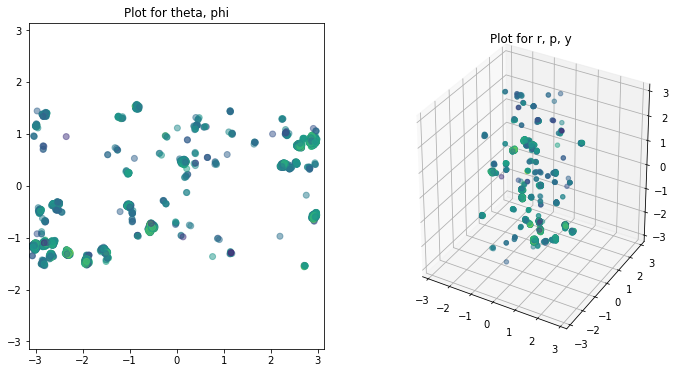

First 200 scores: [13, 7, 14, 12, 12, 9, 8, 15, 9, 10, 12, 12, 6, 6, 15, 9, 11, 11, 13, 12, 12, 14, 13, 13, 9, 14, 8, 15, 11, 10, 12, 7, 8, 12, 6, 10, 7, 12, 9, 13, 12, 8, 12, 10, 14, 12, 14, 12, 9, 12, 12, 11, 12, 12, 14, 12, 14, 10, 14, 11, 10, 7, 7, 11, 12, 8, 11, 16, 5, 11, 9, 12, 9, 7, 7, 8, 12, 10, 9, 15, 10, 10, 12, 12, 12, 13, 10, 13, 11, 6, 10, 9, 11, 10, 15, 12, 9, 10, 14, 13, 13, 11, 9, 9, 10, 9, 10, 8, 11, 13, 10, 12, 10, 10, 11, 11, 10, 11, 11, 10, 12, 9, 10, 10, 15, 8, 6, 11, 12, 10, 10, 6, 11, 9, 9, 9, 12, 13, 11, 11, 12, 9, 14, 13, 12, 9, 10, 10, 11, 13, 12, 9, 9, 10, 12, 17, 8, 11, 14, 15, 12, 11, 10, 13, 11, 10, 11, 9, 11, 13, 12, 8, 13, 11, 9, 9, 10, 12, 12, 12, 13, 8, 15, 10, 11, 10, 14, 11, 4, 10, 13, 11, 15, 14, 12, 14, 11, 12, 10, 8]
Non-match ratio: 0.000000 (0/84599)
Sigma: ['0.003430', '0.003430', '0.003430', '0.003430', '0.003430']
Epsilon: 0.001458
Iteration: 16
Elapsed time: 164.157563s


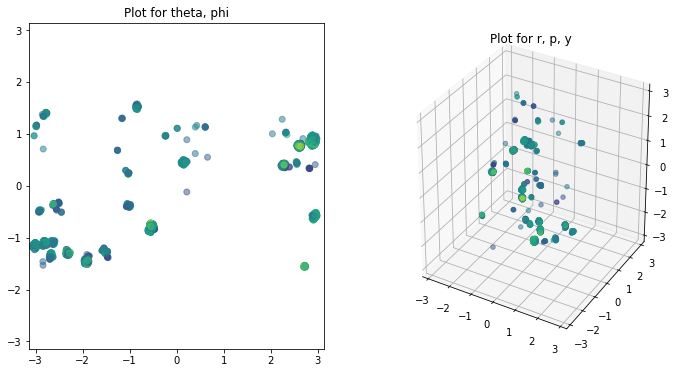

First 200 scores: [12, 14, 12, 13, 12, 12, 13, 12, 9, 16, 11, 11, 11, 12, 9, 15, 12, 14, 7, 6, 11, 12, 10, 11, 8, 12, 10, 12, 9, 12, 14, 14, 11, 10, 15, 11, 10, 14, 15, 10, 9, 13, 15, 10, 13, 12, 14, 10, 13, 9, 14, 10, 6, 9, 13, 8, 11, 9, 13, 11, 12, 12, 12, 11, 11, 10, 14, 9, 12, 7, 13, 14, 11, 6, 11, 9, 10, 8, 8, 10, 10, 14, 14, 14, 14, 12, 8, 10, 9, 11, 11, 17, 15, 15, 11, 12, 8, 9, 6, 11, 11, 11, 13, 14, 11, 11, 10, 12, 13, 13, 12, 12, 14, 13, 13, 11, 15, 10, 9, 9, 14, 14, 10, 9, 12, 12, 10, 12, 11, 13, 15, 10, 11, 11, 9, 13, 10, 9, 13, 14, 11, 10, 8, 11, 13, 12, 14, 13, 10, 10, 10, 10, 13, 14, 11, 9, 10, 9, 10, 11, 13, 13, 12, 12, 11, 12, 10, 13, 15, 13, 11, 13, 13, 12, 11, 14, 14, 12, 12, 6, 10, 9, 11, 10, 9, 12, 15, 13, 10, 12, 10, 13, 10, 13, 11, 9, 10, 10, 11, 14]
Non-match ratio: 0.000000 (0/89814)
Sigma: ['0.003430', '0.003430', '0.003430', '0.003430', '0.003430']
Epsilon: 0.001458
Iteration: 20
Elapsed time: 205.612322s


In [225]:
from helpers import ParticleFilter, generateSamples
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
import time

n_corr = 0
start_time = time.time()
# ---------------------------------------------------------
# Adjustable parameters
# ---------------------------------------------------------

iterations = 20
m = 8000

# Set range to be a uniform cube of length 1 around the solution
# ranges = np.array([[*diff_sph-0.5, 1/m], [*diff_sph+0.5, 1/m]]).T  

ranges = np.array([[-pi, pi],
                   [-pi/2, pi/2],
                   [-pi/2, pi/2], 
                   [-pi/2, pi/2], 
                   [-pi, pi], 
                   [1, 1]])

e = 0.002
sigma = np.array([*[0.01]*5]) 

# Multiply sigma by a factor after a number of iterations
sigma_factor   = 0.7
sigma_interval = 5 

# Multiply epsilon by a factor after a number of iterations
e_factor   = 0.9 #0.5
e_interval = 5

# ---------------------------------------------------------

S_new = generateSamples(m, ranges)

for i in range(iterations):
    S_new, score_list, nmc, mc = ParticleFilter(S_new, sigma, pts1, pts2, n_corr, epsilon = e, epipole_t = 0.1, norm_mode = "softmax")

    # Print for every 5 iterations, and for the last iteration
    if i%5 == 0 or i+1 == iterations: 
        fig = plt.figure(figsize = (18,6))

        ax1 = fig.add_subplot(131)
        ax1.scatter(*S_new[:2,:], c= score_list, alpha=0.5)
        ax1.set_xlim(*[-pi, pi])
        ax1.set_ylim(*[-pi, pi])
        ax1.set_title("Plot for theta, phi")
        
        ax2 = fig.add_subplot(132, projection='3d')
        ax2.scatter(*S_new[2:5,:], c= score_list, alpha=0.5)
        ax2.set_xlim3d(*[-pi, pi])
        ax2.set_ylim3d(*[-pi, pi])
        ax2.set_zlim3d(*[-pi, pi])
        ax2.set_title("Plot for r, p, y")
        
        if S_new.shape[0] == 8:
            ax3 = fig.add_subplot(133)
            ax3.scatter(*S_new[5:7,:], c= score_list, alpha=0.5)
            ax3.set_xlim(*ranges[5])
            ax3.set_ylim(*ranges[6])
            ax3.set_title("Plot for f1, f2")

        plt.show()

        print("First 200 scores: " + str(score_list[:200])) # print first 200 scores only
        print("Non-match ratio: %f (%d/%d)" % (nmc/mc, nmc, mc))
        print("Sigma: " + str(["{0:f}".format(s) for s in sigma]))
        print("Epsilon: %f" % (e))
        print("Iteration: %d" % (i+1))
        print("Elapsed time: %fs" % (time.time() - start_time))
        
    # Decrease sigma over iterations
    if sigma_factor != 1 and (i+1) % sigma_interval == 0:
        sigma *= sigma_factor
    
    # Decrease epsilon over iterations
    if e_factor != 1 and (i+1) % e_interval == 0:
        e *= e_factor

## Recover solution from Particle Filter

In [226]:
# Retrieve highest-scoring points
n_results = 30
top = S_new[:,S_new[-1,:].argsort()][:, -n_results:].T
print("Max score: " + str(max(S_new[-1])))
top = np.vstack({tuple(row) for row in top})
print(top.shape[0])
print(top)
top = top[:,:-1]

Max score: 19.0
30
[[ 2.85678633  0.88080645 -0.34585679  0.47027636 -2.90715714 17.        ]
 [-0.54191292 -0.73132599  0.74125319 -0.85223388 -1.35234983 19.        ]
 [ 2.69854627 -1.55540145 -0.37263471  0.03229143  0.28991253 19.        ]
 [ 2.72186687 -1.55605268 -0.36597095  0.02864186  0.31100196 19.        ]
 [-0.54856257 -0.78666607  0.71880875 -0.85690838 -1.31810875 18.        ]
 [-0.53409907 -0.79539665  0.71220655 -0.84008586 -1.32845471 18.        ]
 [-0.53983513 -0.74738553  0.71665284 -0.8297477  -1.38719109 18.        ]
 [-0.55247179 -0.74365308  0.73540783 -0.86219732 -1.34403543 18.        ]
 [-0.5318797  -0.76494741  0.68737673 -0.80180604 -1.3253869  18.        ]
 [-0.54684866 -0.73140279  0.73968449 -0.85184556 -1.38831349 18.        ]
 [-0.5668708  -0.7781774   0.72244276 -0.87726551 -1.33543818 18.        ]
 [-0.57489238 -0.78145054  0.70748022 -0.87102937 -1.33407143 18.        ]
 [-0.55436523 -0.72056481  0.74893619 -0.86630987 -1.34806477 18.        ]
 [ 2.7

[[ 2.86302911  0.87321438 -0.3508374   0.47631628 -2.88445737]
 [-0.55030791 -0.76179531  0.72251969 -0.85298145 -1.34099778]
 [ 2.71701095 -1.55328097 -0.36945683  0.02806067  0.30202791]
 [ 2.63012669  0.77549996 -1.30935663  1.23533154 -1.72865927]]


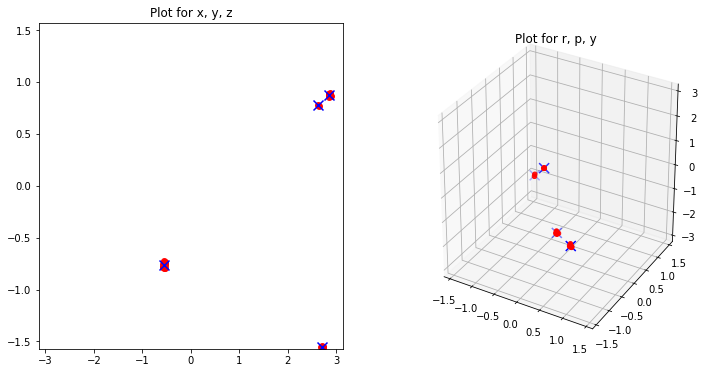

In [227]:
# Retrieve clusters
from sklearn.cluster import KMeans

num_clusters = 4

kmeans_model = KMeans(n_clusters = num_clusters).fit(top)
results = kmeans_model.cluster_centers_
print(results)

res = results.T

fig = plt.figure(figsize = (12,6))
ax1 = fig.add_subplot(121)
ax1.scatter(*top.T[:2,:], c='red', alpha=0.9)
ax1.scatter(*res[:2,:], c='blue', marker='x', s=100)
ax1.set_xlim(*ranges[0])
ax1.set_ylim(*ranges[1])
ax1.set_title("Plot for x, y, z")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(*top.T[2:,:m//4], c='red', alpha=0.9)
ax2.scatter(*res[2:,:], zdir='z', c='blue', marker='x', s=100)
ax2.set_xlim3d(*ranges[2])
ax2.set_ylim3d(*ranges[3])
ax2.set_zlim3d(*ranges[4])
ax2.set_title("Plot for r, p, y")
plt.show()

In [233]:
# Construct E from solution t and r, check that (pts1)' E (pts2) = 0

from helpers import rpy2R, xyz2T, sphericalToCartesian
from numpy.linalg import norm

pts1_uvf = np.concatenate((pts1, np.ones((pts1.shape[0], 1))), axis = 1)
pts2_uvf = np.concatenate((pts2, np.ones((pts2.shape[0], 1))), axis = 1)

E_results = []
E_products = []

# Compare with ground truth
F_gt = np.array([[-0.01293429, -0.1909383,  -0.10833719],
                 [-0.13092871,  0.0307668,  -0.68630072],
                 [-0.02572282,  0.679591 ,   0.00592726]])

for res_idx in range(results.shape[0]):
    t  = sphericalToCartesian(1, *results[res_idx, :2])
    r  = results[res_idx, 2:]
    
    T = xyz2T(t[0], t[1], t[2])
    R = rpy2R(r[0], r[1], r[2])
    E = np.dot((1/sqrt(2))*T,R)
    print(E)
    print(norm(E - F_gt))
    print()
    E_results.append(E)
    E_products.append(pts1_uvf @ E @ pts2_uvf.T)

[[-0.11308002 -0.46335475  0.03222209]
 [-0.28002396 -0.14204975 -0.61579441]
 [-0.03784633 -0.48490909  0.23898442]]
1.2536291168098497

[[ 0.17145186 -0.54440454 -0.03417427]
 [ 0.49249576 -0.0124131  -0.43835026]
 [-0.10627229 -0.4364349   0.19087622]]
1.3793646842555303

[[ 0.0909013  -0.01930852 -0.27629445]
 [ 0.20265528 -0.01269003 -0.61151344]
 [ 0.03719023  0.70597159 -0.0082237 ]]
0.4382492490410951

[[ 0.1626001  -0.53378196 -0.04788598]
 [ 0.40579222 -0.02520493 -0.52534858]
 [-0.05571171 -0.44425324  0.21115513]]
1.3323512701664264



In [234]:
E_results

[array([[-0.11308002, -0.46335475,  0.03222209],
        [-0.28002396, -0.14204975, -0.61579441],
        [-0.03784633, -0.48490909,  0.23898442]]),
 array([[ 0.17145186, -0.54440454, -0.03417427],
        [ 0.49249576, -0.0124131 , -0.43835026],
        [-0.10627229, -0.4364349 ,  0.19087622]]),
 array([[ 0.0909013 , -0.01930852, -0.27629445],
        [ 0.20265528, -0.01269003, -0.61151344],
        [ 0.03719023,  0.70597159, -0.0082237 ]]),
 array([[ 0.1626001 , -0.53378196, -0.04788598],
        [ 0.40579222, -0.02520493, -0.52534858],
        [-0.05571171, -0.44425324,  0.21115513]])]

Comparing all n' x n matches


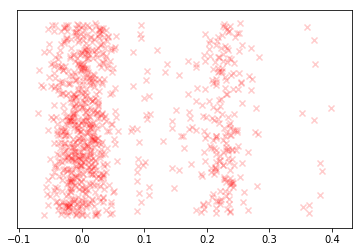

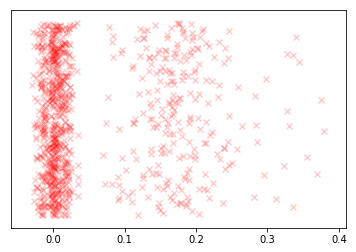

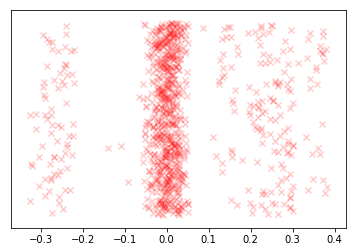

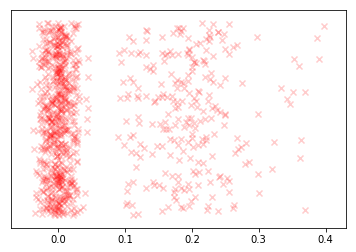

In [235]:
print("Comparing all n' x n matches")
for sol in E_products:
    vals = sol.flatten()
    plt.scatter(vals, np.random.rand(vals.shape[0]), marker='x', color='r', alpha = 0.2)
    plt.yticks([])
    plt.show()

## Plot epipolar lines with E

In [272]:
def drawlines(img1,img2,lines,pts1,pts2,K1):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    rw,c,ch = img1.shape
    
    img1 = img1.copy()
    img2 = img2.copy()
    
    fx = K1[0,0]
    fy = K1[1,1]
    px = K1[0,2]
    py = K1[1,2]
    
    # split colour spectrum 
    n = lines.shape[0]
    col_interval = 255//(n+1)
    
    i = 0
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(cv2.cvtColor(np.uint8([[[col_interval*i, 200, 200]]]), cv2.COLOR_HSV2BGR)[0,0].tolist())

        x0,y0 = map(int, [-fx + px, fy*(-(r[0]*-1 + r[2])/r[1]) + py ])
        x1,y1 = map(int, [ fx + px, fy*(-(r[0]* 1 + r[2])/r[1]) + py ])
        
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color, 4)
        
        img1 = cv2.circle(img1,(int(round(fx*pt1[0] + px)), int(round(fy*pt1[1] + py))),20,color,-1)
        img2 = cv2.circle(img2,(int(round(fx*pt2[0] + px)), int(round(fy*pt2[1] + py))),20,color,-1)
        
        i += 1
        
    return img1,img2

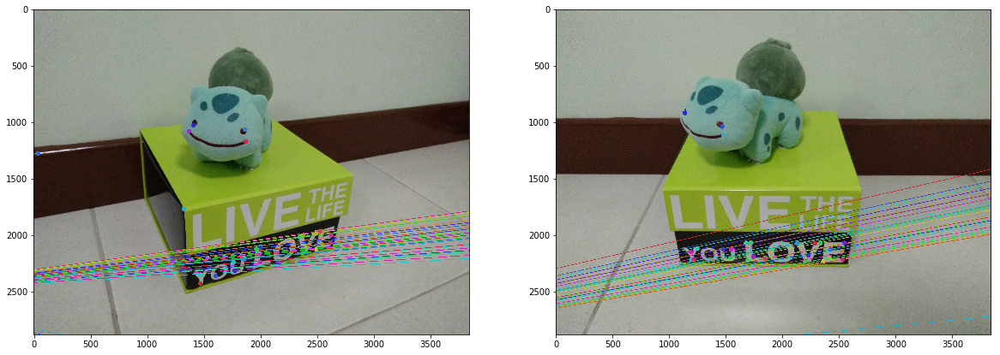

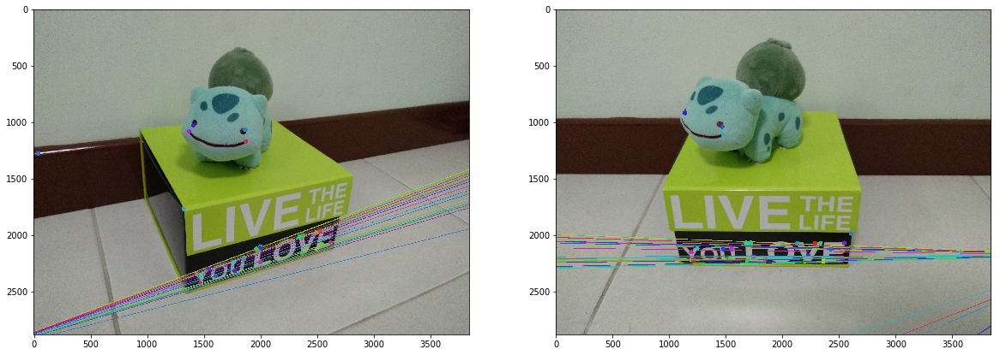

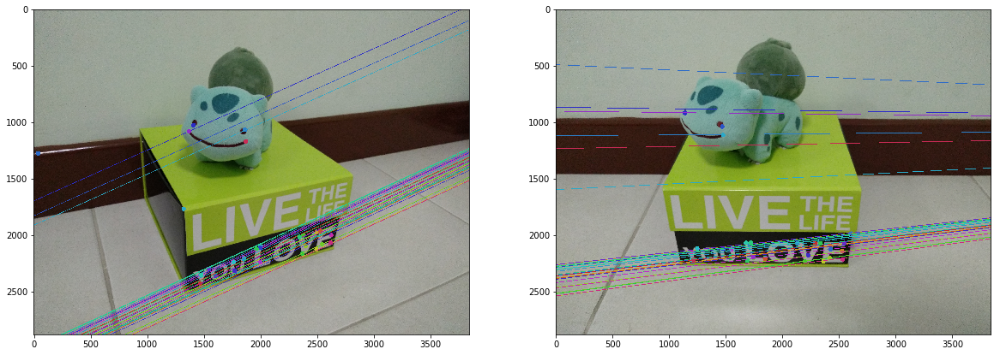

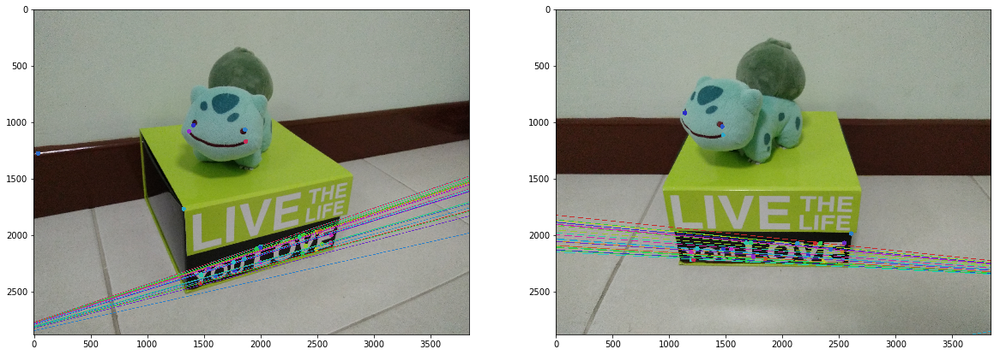

In [273]:
K = np.array([[3142.48386708,    0.        , 2008.49963471],
              [   0.        , 3156.22945417, 1484.50729327],
              [   0.        ,    0.        ,    1.        ]])

for E in E_results:
    # Find epilines corresponding to points (whichImage contains the points, the other image contains lines)

    lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 1, E)
    lines1 = lines1.reshape(-1,3)
    img5,img6 = drawlines(img1,img2,lines1,pts1,pts2, K)

    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image

    lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 2, E)
    lines2 = lines2.reshape(-1,3)
    img3,img4 = drawlines(img2,img1,lines2,pts2,pts1, K)

    plt.figure(2, figsize=(20,10))
    plt.subplot(121),plt.imshow(img5)
    plt.subplot(122),plt.imshow(img3)
    plt.show()

In [257]:
del img3, img4, img5, img6

## 3. Run Particle Filter with resampling mode - ComputeF


In [274]:
import helpers
from importlib import reload
reload(helpers)

<module 'helpers' from 'D:\\Courses\\NUS\\DCVPC\\code\\helpers.py'>

## Recover solution from Particle Filter

D:\Courses\NUS\DCVPC\code\helpers.py:208: RuntimeWarning: invalid value encountered in less
  all_matches = dists < epsilon


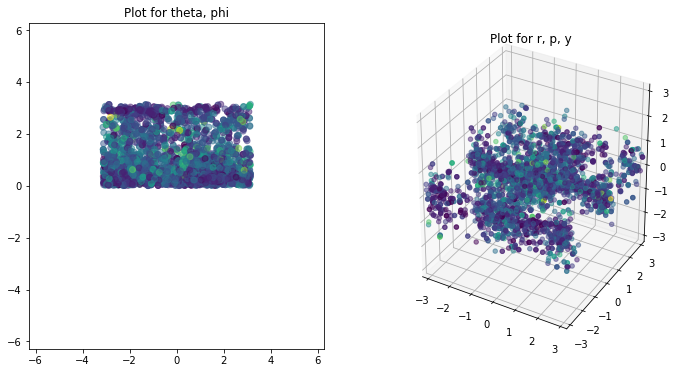

First 200 scores: [7, 9, 9, 8, 9, 7, 10, 9, 6, 9, 7, 7, 8, 8, 7, 9, 7, 8, 6, 8, 6, 7, 7, 6, 11, 6, 9, 7, 7, 8, 8, 7, 13, 7, 8, 9, 6, 8, 11, 6, 8, 7, 8, 7, 12, 7, 7, 7, 5, 9, 13, 9, 6, 6, 9, 8, 6, 9, 6, 8, 6, 7, 8, 10, 9, 6, 11, 7, 7, 8, 10, 8, 7, 10, 5, 6, 13, 9, 11, 7, 8, 6, 9, 8, 8, 9, 9, 7, 8, 6, 11, 6, 7, 6, 10, 8, 6, 7, 8, 6, 8, 6, 7, 7, 6, 6, 8, 9, 7, 6, 7, 7, 8, 8, 11, 10, 11, 8, 8, 8, 12, 6, 8, 6, 5, 6, 8, 7, 7, 9, 8, 7, 6, 8, 7, 6, 5, 6, 10, 8, 9, 9, 7, 6, 9, 10, 8, 9, 6, 6, 8, 9, 6, 7, 8, 6, 9, 5, 9, 11, 9, 7, 7, 6, 7, 6, 6, 8, 10, 8, 8, 8, 6, 8, 9, 8, 8, 10, 8, 9, 6, 6, 7, 6, 5, 6, 7, 8, 6, 6, 7, 9, 5, 6, 6, 10, 11, 8, 7, 13]
Non-match ratio: 0.000000 (0/33816)
Sigma: ['0.080000', '0.080000', '0.080000', '0.080000', '0.080000']
Epsilon: 0.008000
Iteration: 1
Elapsed time: 59.977540s


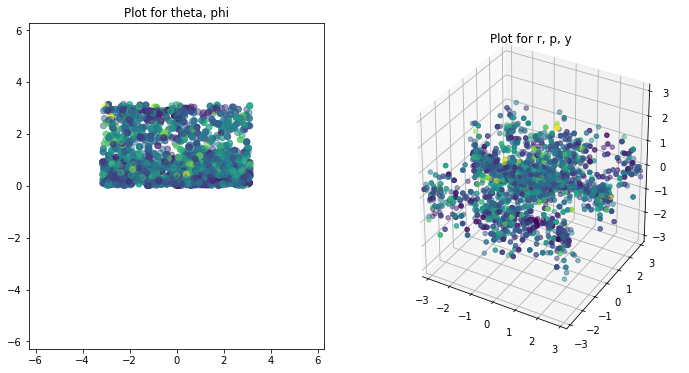

First 200 scores: [11, 15, 9, 10, 8, 6, 12, 10, 7, 9, 12, 12, 6, 8, 12, 7, 13, 7, 9, 6, 11, 10, 6, 8, 7, 8, 10, 6, 12, 8, 8, 5, 9, 7, 12, 9, 10, 7, 12, 7, 10, 8, 10, 11, 10, 7, 13, 7, 9, 11, 11, 14, 11, 6, 9, 12, 6, 11, 7, 5, 8, 10, 9, 10, 8, 11, 5, 11, 6, 12, 7, 9, 13, 12, 8, 9, 5, 8, 10, 13, 5, 9, 14, 9, 11, 8, 7, 7, 9, 14, 14, 9, 7, 13, 6, 15, 13, 7, 13, 9, 7, 15, 8, 6, 9, 11, 13, 6, 6, 6, 16, 7, 8, 9, 10, 8, 15, 11, 7, 13, 13, 10, 9, 7, 7, 11, 13, 12, 6, 6, 10, 16, 6, 9, 8, 8, 5, 9, 13, 10, 14, 9, 7, 10, 6, 8, 8, 9, 8, 11, 7, 9, 13, 10, 6, 11, 14, 9, 10, 9, 8, 7, 11, 12, 7, 12, 8, 10, 8, 8, 12, 8, 9, 7, 10, 9, 9, 6, 9, 8, 8, 13, 10, 12, 11, 8, 13, 11, 9, 7, 12, 7, 12, 10, 14, 7, 9, 8, 5, 8]
Non-match ratio: 0.000000 (0/39252)
Sigma: ['0.080000', '0.080000', '0.080000', '0.080000', '0.080000']
Epsilon: 0.007200
Iteration: 2
Elapsed time: 85.326659s


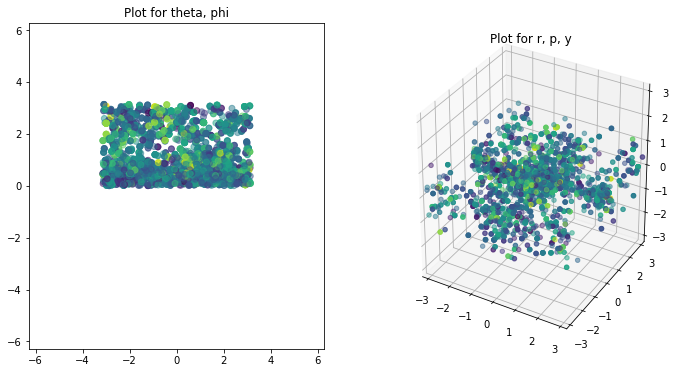

First 200 scores: [8, 9, 7, 14, 9, 6, 14, 10, 9, 8, 8, 9, 13, 7, 8, 11, 14, 12, 5, 7, 11, 12, 8, 10, 7, 13, 7, 11, 15, 10, 11, 11, 7, 14, 9, 10, 7, 12, 10, 7, 13, 12, 12, 9, 10, 9, 12, 11, 13, 6, 9, 9, 11, 10, 12, 10, 10, 9, 15, 10, 8, 12, 10, 8, 6, 9, 10, 14, 8, 13, 14, 8, 16, 12, 10, 11, 12, 13, 15, 13, 15, 11, 10, 11, 11, 10, 9, 11, 11, 9, 9, 16, 11, 10, 10, 12, 9, 13, 10, 7, 7, 10, 9, 11, 9, 10, 10, 9, 10, 8, 14, 11, 8, 15, 8, 14, 10, 9, 12, 10, 12, 7, 10, 9, 14, 8, 13, 13, 13, 11, 9, 11, 9, 9, 11, 12, 12, 8, 7, 11, 8, 8, 11, 9, 10, 10, 11, 12, 11, 8, 9, 9, 9, 13, 11, 8, 14, 11, 8, 12, 9, 8, 9, 10, 7, 7, 14, 6, 9, 11, 10, 12, 14, 13, 8, 9, 10, 13, 8, 9, 9, 17, 9, 9, 8, 8, 9, 9, 11, 12, 10, 9, 9, 13, 8, 10, 10, 13, 9, 8]
Non-match ratio: 0.000000 (0/43121)
Sigma: ['0.080000', '0.080000', '0.080000', '0.080000', '0.080000']
Epsilon: 0.006480
Iteration: 3
Elapsed time: 108.383373s


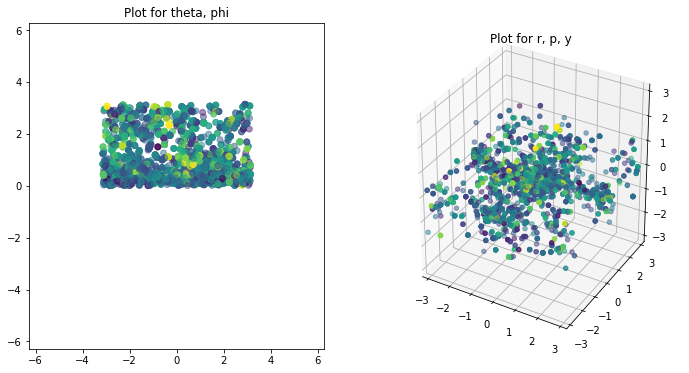

First 200 scores: [13, 9, 14, 10, 10, 11, 11, 10, 9, 10, 14, 12, 12, 9, 11, 11, 12, 12, 15, 16, 9, 9, 13, 9, 10, 11, 10, 13, 11, 13, 7, 11, 10, 11, 13, 12, 9, 14, 9, 10, 7, 13, 11, 11, 13, 10, 14, 13, 10, 11, 12, 15, 11, 11, 12, 8, 9, 12, 7, 9, 10, 8, 8, 9, 15, 9, 10, 11, 10, 14, 9, 12, 16, 11, 10, 15, 13, 8, 11, 15, 12, 9, 10, 11, 9, 12, 13, 12, 10, 11, 9, 12, 12, 12, 9, 10, 13, 10, 10, 8, 9, 8, 15, 14, 12, 15, 9, 15, 10, 13, 8, 14, 10, 15, 10, 10, 12, 8, 16, 12, 14, 10, 9, 13, 8, 11, 9, 10, 9, 11, 9, 10, 10, 11, 12, 11, 9, 11, 11, 7, 12, 11, 11, 16, 8, 14, 10, 10, 8, 7, 11, 9, 11, 7, 15, 14, 9, 12, 11, 8, 10, 13, 11, 10, 11, 9, 8, 11, 10, 7, 9, 11, 11, 11, 9, 12, 12, 13, 10, 13, 13, 14, 11, 7, 12, 13, 8, 13, 8, 14, 9, 11, 10, 15, 9, 17, 8, 11, 12, 14]
Non-match ratio: 0.000000 (0/46310)
Sigma: ['0.080000', '0.080000', '0.080000', '0.080000', '0.080000']
Epsilon: 0.005832
Iteration: 4
Elapsed time: 129.070121s


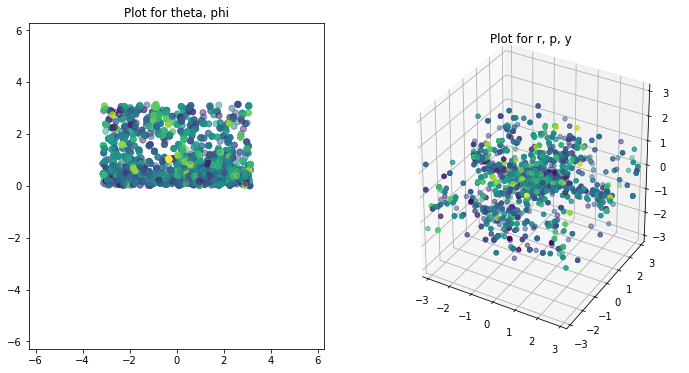

First 200 scores: [10, 12, 12, 10, 9, 14, 18, 11, 9, 10, 9, 12, 16, 15, 13, 16, 12, 15, 12, 11, 13, 15, 17, 11, 13, 10, 14, 12, 16, 11, 11, 9, 16, 15, 10, 11, 14, 12, 14, 10, 10, 15, 10, 9, 13, 9, 14, 16, 9, 13, 8, 14, 13, 10, 12, 7, 12, 15, 12, 15, 15, 13, 13, 12, 16, 10, 10, 11, 11, 11, 11, 16, 9, 12, 10, 13, 14, 13, 13, 14, 14, 12, 12, 7, 10, 9, 10, 11, 13, 10, 11, 11, 9, 14, 12, 12, 15, 11, 13, 11, 11, 15, 10, 11, 7, 12, 11, 7, 13, 11, 17, 11, 14, 8, 14, 13, 11, 10, 15, 11, 9, 10, 9, 10, 10, 11, 6, 12, 10, 16, 13, 15, 10, 13, 11, 14, 10, 14, 12, 13, 10, 12, 17, 14, 16, 10, 13, 10, 9, 11, 10, 10, 10, 10, 9, 12, 10, 12, 12, 12, 12, 14, 16, 9, 14, 11, 14, 9, 12, 11, 14, 11, 11, 8, 12, 12, 12, 12, 14, 14, 14, 10, 11, 11, 13, 10, 13, 10, 12, 14, 12, 11, 14, 12, 13, 14, 17, 12, 16, 7]
Non-match ratio: 0.000000 (0/48825)
Sigma: ['0.080000', '0.080000', '0.080000', '0.080000', '0.080000']
Epsilon: 0.005249
Iteration: 5
Elapsed time: 148.296901s


In [345]:
from helpers import ParticleFilter, generateSamples
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
import time
from math import pi

n_corr = 0
start_time = time.time()
# ---------------------------------------------------------
# Adjustable parameters
# ---------------------------------------------------------

iterations = 5
m = 20000

# Set range to be a uniform cube of length 1 around the solution
# ranges = np.array([[*diff_sph-0.5, 1/m], [*diff_sph+0.5, 1/m]]).T  

ranges = np.array([[-pi/2, pi/2],
                   [-pi/2, pi/2],
                   [-pi/4, pi/4], 
                   [-pi/4, pi/4], 
                   [-pi, pi], 
                   [1/m, 1/m]])

e = 0.008
sigma = np.array([*[0.08]*5]) 

# Multiply sigma by a factor after a number of iterations
sigma_factor   = 0.7
sigma_interval = 5 

# Multiply epsilon by a factor after a number of iterations
e_factor   = 0.9 #0.5
e_interval = 1

# ---------------------------------------------------------

S_new = generateSamples(m, ranges)

for i in range(iterations):
    S_new, score_list, nmc, mc = ParticleFilter(S_new, sigma, pts1, pts2, n_corr, epsilon = e, epipole_t = 0.1, 
                                                norm_mode = 'softmax', resampling = "ComputeF")
    
    # Print for every 5 iterations, and for the last iteration
    if i%1 == 0 or i+1 == iterations: 
        fig = plt.figure(figsize = (18,6))

        ax1 = fig.add_subplot(131)
        ax1.scatter(*S_new[:2,:], c= score_list, alpha=0.5)
        ax1.set_xlim(*[-2*pi, 2*pi])
        ax1.set_ylim(*[-2*pi, 2*pi])
        ax1.set_title("Plot for theta, phi")
        
        ax2 = fig.add_subplot(132, projection='3d')
        ax2.scatter(*S_new[2:5,:], c= score_list, alpha=0.5)
        ax2.set_xlim3d(*[-pi, pi])
        ax2.set_ylim3d(*[-pi, pi])
        ax2.set_zlim3d(*[-pi, pi])
        ax2.set_title("Plot for r, p, y")
        
        if S_new.shape[0] == 8:
            ax3 = fig.add_subplot(133)
            ax3.scatter(*S_new[5:7,:], c= score_list, alpha=0.5)
            ax3.set_xlim(*ranges[5])
            ax3.set_ylim(*ranges[6])
            ax3.set_title("Plot for f1, f2")

        plt.show()

        print("First 200 scores: " + str(score_list[:200])) # print first 200 scores only
        print("Non-match ratio: %f (%d/%d)" % (nmc/mc, nmc, mc))
        print("Sigma: " + str(["{0:f}".format(s) for s in sigma]))
        print("Epsilon: %f" % (e))
        print("Iteration: %d" % (i+1))
        print("Elapsed time: %fs" % (time.time() - start_time))
        
    # Decrease sigma over iterations
    if sigma_factor != 1 and (i+1) % sigma_interval == 0:
        sigma *= sigma_factor
    
    # Decrease epsilon over iterations
    if e_factor != 1 and (i+1) % e_interval == 0:
        e *= e_factor

In [352]:
# Retrieve highest-scoring points
np.set_printoptions(suppress=True)
n_results = 30
results = S_new[:,S_new[-1,:].argsort()][:, -n_results:].T
print("Max score: " + str(max(S_new[-1])))
results = np.vstack({tuple(row) for row in results})
print(results)
results = results[:,:-1]

Max score: 18.0
[[ 2.22261949  1.09541211  0.81934772  1.88785247  1.50407303 17.        ]
 [-0.33199885  1.02596888 -0.39012027  0.02489046 -0.71672182 18.        ]
 [-2.73560589  2.72966448  3.11340023  0.41812149  0.04426343 17.        ]
 [ 0.71244871  0.81236984 -0.98624604  1.7845617   0.2708936  17.        ]
 [ 0.39453277  0.44842743 -0.65026449  2.79847331  0.71748775 17.        ]]


In [353]:
# Construct E from solution t and r, check that (pts1)' E (pts2) = 0

from helpers import rpy2R, xyz2T, sphericalToCartesian
from math import sqrt
from numpy.linalg import norm

pts1_uvf = np.concatenate((pts1, np.ones((pts1.shape[0], 1))), axis = 1)
pts2_uvf = np.concatenate((pts2, np.ones((pts2.shape[0], 1))), axis = 1)

E_results2 = []
E_products2 = []

# Compare with ground truth
F_gt = np.array([[-0.01293429, -0.1909383,  -0.10833719],
                 [-0.13092871,  0.0307668,  -0.68630072],
                 [-0.02572282,  0.679591 ,   0.00592726]])

for res_idx in range(results.shape[0]):
    t  = sphericalToCartesian(1, *results[res_idx, :2])
    r  = results[res_idx, 2:]
    
    T = xyz2T(t[0], t[1], t[2])
    R = rpy2R(r[0], r[1], r[2])
    E = np.dot((1/sqrt(2))*T,R)
    print(E)
    print(norm(E - F_gt))
    print()
    E_results2.append(E)
    E_products2.append(pts1_uvf @ E @ pts2_uvf.T)

[[-0.51445845 -0.12364344  0.27310116]
 [-0.3658133   0.30734895  0.14803157]
 [-0.04133103 -0.6203743   0.0932306 ]]
1.7108782486552292

[[-0.02439986 -0.3448092  -0.23165158]
 [-0.12001765  0.12305704 -0.65696553]
 [-0.02648519  0.60409574  0.00804396]]
0.23284295215075126

[[ 0.02319454 -0.63692897  0.16165849]
 [ 0.6355568   0.13383605  0.25623163]
 [-0.11897776  0.23257536 -0.10910476]]
1.4076054175460297

[[ 0.30100446  0.47893817  0.1706527 ]
 [ 0.36252994 -0.3816249  -0.33218576]
 [-0.49054363 -0.11924393  0.09288235]]
1.4233235576822882

[[ 0.21317478  0.59279454 -0.15183632]
 [ 0.56820367 -0.32282702 -0.24298524]
 [-0.19976087 -0.20359265  0.11237431]]
1.516321706325832



Comparing all n' x n matches


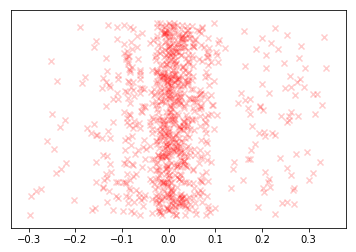

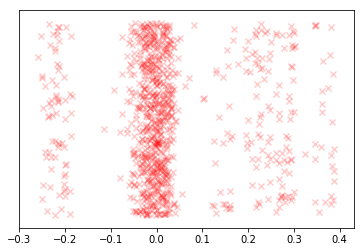

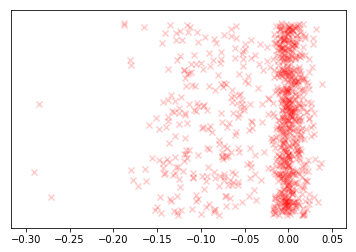

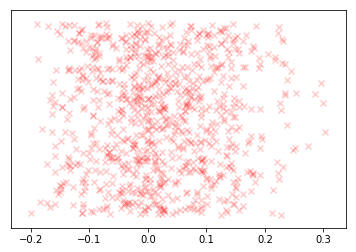

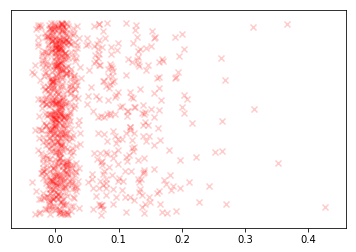

In [354]:
print("Comparing all n' x n matches")
for sol in E_products2:
    vals = sol.flatten()
    plt.scatter(vals, np.random.rand(vals.shape[0]), marker='x', color='r', alpha = 0.2)
    plt.yticks([])
    plt.show()

## Plot epipolar lines with E

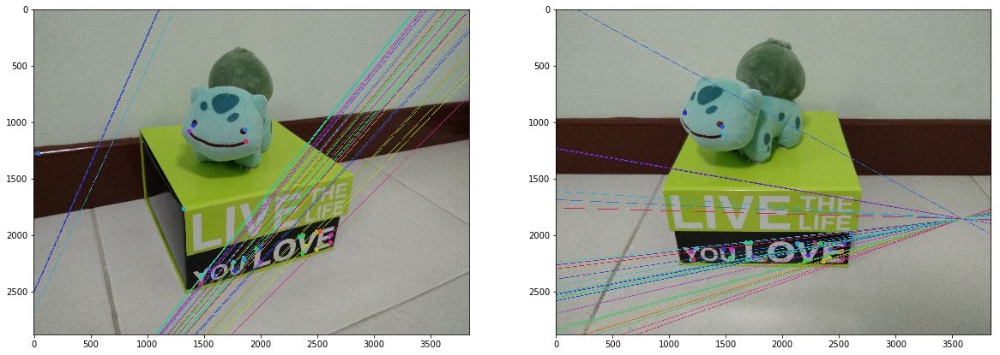

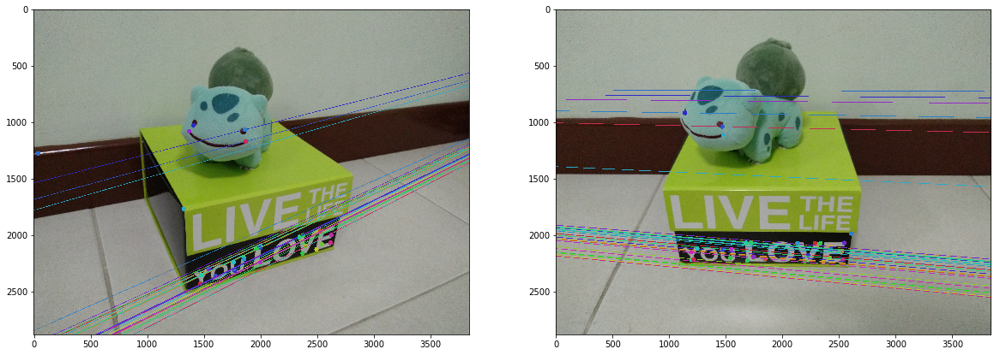

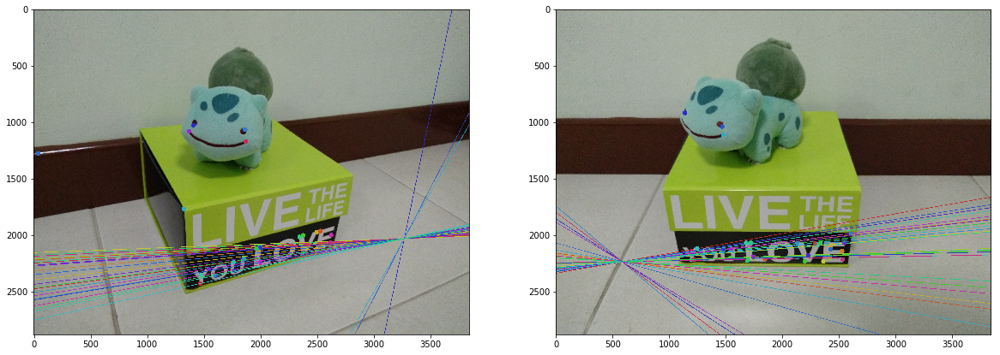

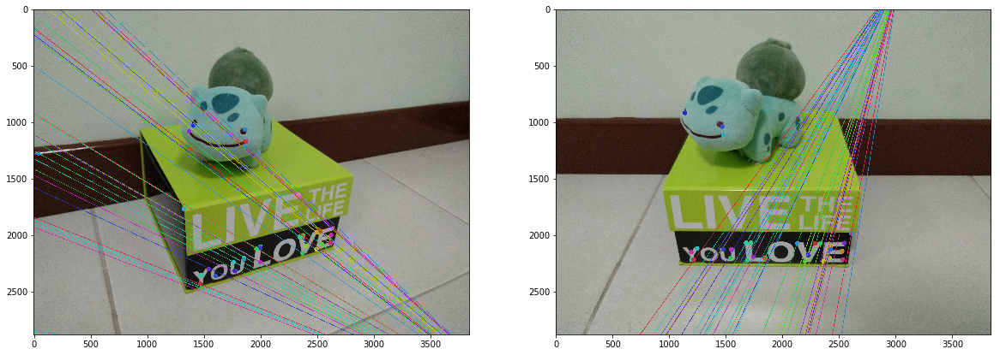

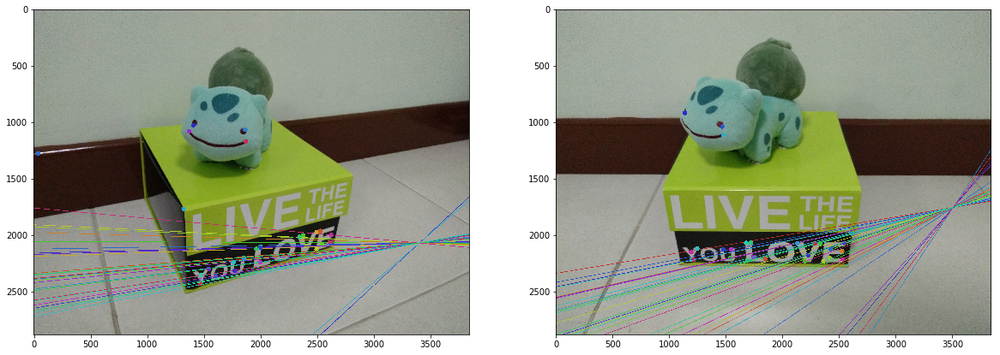

In [355]:
for E in E_results2:
    # Find epilines corresponding to points (whichImage contains the points, the other image contains lines)

    lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 1, E)
    lines1 = lines1.reshape(-1,3)
    img5,img6 = drawlines(img1,img2,lines1,pts1,pts2,K)

    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image

    lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 2, E)
    lines2 = lines2.reshape(-1,3)
    img3,img4 = drawlines(img2,img1,lines2,pts2,pts1,K)

    plt.figure(2, figsize=(20,10))
    plt.subplot(121),plt.imshow(img5)
    plt.subplot(122),plt.imshow(img3)
    plt.show()